**Install required Packages**

In [ ]:
pip install pandas matplotlib scikit-learn


**Data set Loading**

In [ ]:
import pandas as pd

# Load the dataset
df = pd.read_csv('/content/drive/MyDrive/Reviews.csv')  # Update with your file path

# Display basic information about the dataset
print("Data before cleaning:")
print(df.info())

# Check the first few rows of the dataset
print(df.head())


Data before cleaning:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 568454 entries, 0 to 568453
Data columns (total 10 columns):
 #   Column                  Non-Null Count   Dtype 
---  ------                  --------------   ----- 
 0   Id                      568454 non-null  int64 
 1   ProductId               568454 non-null  object
 2   UserId                  568454 non-null  object
 3   ProfileName             568428 non-null  object
 4   HelpfulnessNumerator    568454 non-null  int64 
 5   HelpfulnessDenominator  568454 non-null  int64 
 6   Score                   568454 non-null  int64 
 7   Time                    568454 non-null  int64 
 8   Summary                 568427 non-null  object
 9   Text                    568454 non-null  object
dtypes: int64(5), object(5)
memory usage: 43.4+ MB
None
   Id   ProductId          UserId                      ProfileName  \
0   1  B001E4KFG0  A3SGXH7AUHU8GW                       delmartian   
1   2  B00813GRG4  A1D87F6ZCVE5NK  

**Cleaning of Data**

In [ ]:
# Drop rows with missing values in critical columns
df = df.dropna(subset=['Score', 'Time'])

# Convert the 'Time' column from int to datetime format (assuming it's in Unix timestamp format)
df['Date'] = pd.to_datetime(df['Time'], unit='s')

# Drop the 'Time' column as we now have 'Date'
df.drop(columns=['Time'], inplace=True)

# Display cleaned data
print("Data after cleaning:")
print(df.info())


Data after cleaning:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 568454 entries, 0 to 568453
Data columns (total 10 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   Id                      568454 non-null  int64         
 1   ProductId               568454 non-null  object        
 2   UserId                  568454 non-null  object        
 3   ProfileName             568428 non-null  object        
 4   HelpfulnessNumerator    568454 non-null  int64         
 5   HelpfulnessDenominator  568454 non-null  int64         
 6   Score                   568454 non-null  int64         
 7   Summary                 568427 non-null  object        
 8   Text                    568454 non-null  object        
 9   Date                    568454 non-null  datetime64[ns]
dtypes: datetime64[ns](1), int64(4), object(5)
memory usage: 43.4+ MB
None


**SQL Integration for Data Exploration**

In [ ]:
import sqlite3

# Create a connection to an in-memory SQLite database
conn = sqlite3.connect(':memory:')

# Write the pandas DataFrame to the SQL database as a table
df.to_sql('reviews', conn, if_exists='replace', index=False)

# Confirm the data was written to the database by running a simple SQL query
#Example Query 1
query = "SELECT * FROM reviews LIMIT 5"
result = pd.read_sql(query, conn)
print("Data in SQL (first 5 rows):")
print(result)


Data in SQL (first 5 rows):
   Id   ProductId          UserId                      ProfileName  \
0   1  B001E4KFG0  A3SGXH7AUHU8GW                       delmartian   
1   2  B00813GRG4  A1D87F6ZCVE5NK                           dll pa   
2   3  B000LQOCH0   ABXLMWJIXXAIN  Natalia Corres "Natalia Corres"   
3   4  B000UA0QIQ  A395BORC6FGVXV                             Karl   
4   5  B006K2ZZ7K  A1UQRSCLF8GW1T    Michael D. Bigham "M. Wassir"   

   HelpfulnessNumerator  HelpfulnessDenominator  Score                Summary  \
0                     1                       1      5  Good Quality Dog Food   
1                     0                       0      1      Not as Advertised   
2                     1                       1      4  "Delight" says it all   
3                     3                       3      2         Cough Medicine   
4                     0                       0      5            Great taffy   

                                                Text            

In [ ]:
# SQL query to calculate average score
query = "SELECT AVG(Score) AS Average_Score FROM reviews"
average_score = pd.read_sql(query, conn)
print("Average Review Score:")
print(average_score)


Average Review Score:
   Average_Score
0       4.183199


In [ ]:
# SQL query to find the top 5 most helpful reviews
query = """
SELECT ProfileName, Score, HelpfulnessNumerator, HelpfulnessDenominator
FROM reviews
ORDER BY HelpfulnessNumerator DESC
LIMIT 5
"""
most_helpful_reviews = pd.read_sql(query, conn)
print("Most Helpful Reviews:")
print(most_helpful_reviews)


Most Helpful Reviews:
                      ProfileName  Score  HelpfulnessNumerator  \
0                      P. Schmidt      5                   866   
1           BabbChuck "BabbChuck"      3                   844   
2               Benjamin Chodroff      5                   808   
3       Y. Hughes "Notmyrealname"      1                   580   
4  D. Truong "Duke of New Mexico"      5                   559   

   HelpfulnessDenominator  
0                     878  
1                     923  
2                     815  
3                     593  
4                     562  


**Visualizing Review Scores Distribution**

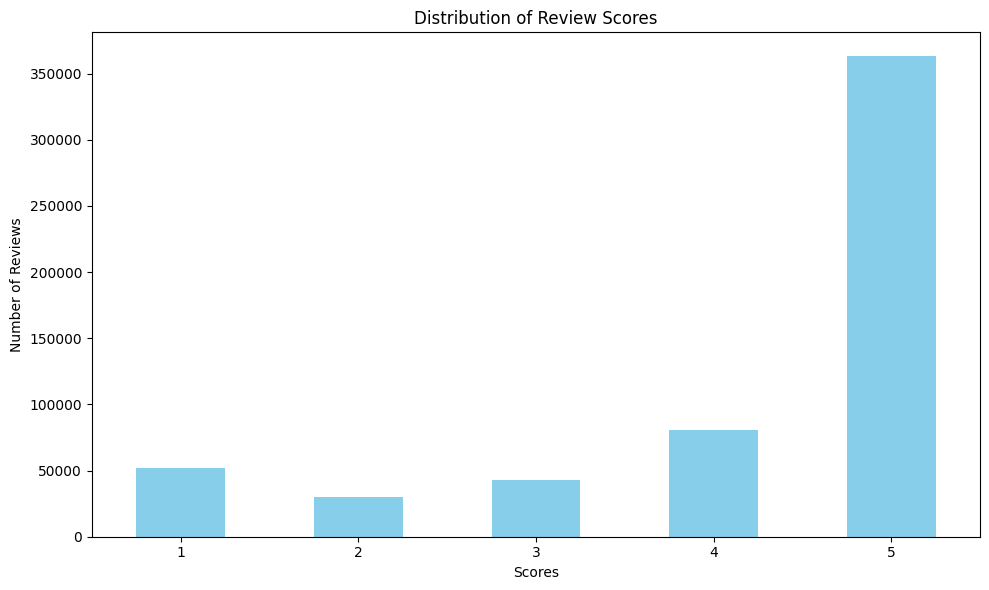

In [ ]:
import matplotlib.pyplot as plt

# Plotting the distribution of scores
plt.figure(figsize=(10, 6))
df['Score'].value_counts().sort_index().plot(kind='bar', color='skyblue')
plt.title('Distribution of Review Scores')
plt.xlabel('Scores')
plt.ylabel('Number of Reviews')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


In [ ]:
# Close the SQLite connection
conn.close()


**Sentiment Analysis Using VADER**

In [ ]:
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer

nltk.download('vader_lexicon')
sia = SentimentIntensityAnalyzer()

# Add sentiment score to the DataFrame
df['Sentiment'] = df['Text'].apply(lambda x: sia.polarity_scores(x)['compound'])
print("Data with Sentiment Scores:")
print(df[['Text', 'Sentiment']].head())


[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


Data with Sentiment Scores:
                                                Text  Sentiment
0  I have bought several of the Vitality canned d...     0.9441
1  Product arrived labeled as Jumbo Salted Peanut...    -0.5664
2  This is a confection that has been around a fe...     0.8265
3  If you are looking for the secret ingredient i...     0.0000
4  Great taffy at a great price.  There was a wid...     0.9468


**Anomaly Detection Using Z-Scores**

In [12]:
from scipy import stats

# Calculate Z-scores
df['Z_Score'] = stats.zscore(df['Sentiment'])
anomalies = df[(df['Z_Score'] > 3) | (df['Z_Score'] < -3)]
print("Anomalies in Sentiment Scores:")
print(anomalies[['Text', 'Sentiment', 'Z_Score']])


Anomalies in Sentiment Scores:
                                                     Text  Sentiment   Z_Score
11      One of my boys needed to lose some weight and ...    -0.7579 -3.013906
52      This wasn't in stock the last time I looked. I...    -0.8259 -3.159752
67      I purchased the Mango flavor, and to me it doe...    -0.9116 -3.343561
169     The item over all was fine, but the Banana Hea...    -0.7721 -3.044362
213     As with canidae, Felidae has also changed thei...    -0.9726 -3.474394
...                                                   ...        ...       ...
568268  Tried using Stevia instead of white sugar in m...    -0.7919 -3.086829
568275  Stevia in the raw contains saccharine, which i...    -0.8752 -3.265491
568330  Ordered coffee for a few months. Now I would n...    -0.9326 -3.388602
568379  I hadn't tried this taco seasoning prior to pu...    -0.8628 -3.238895
568426  The candy is tasty, but they totally scam you ...    -0.8615 -3.236107

[14469 rows x 3 colu

**Time Series Forecasting Using ARIMA**

In [13]:
# Group by Date
daily_sentiment = df.groupby('Date')['Sentiment'].mean().reset_index()

# Time Series Forecasting (simple example)
from statsmodels.tsa.arima.model import ARIMA

model = ARIMA(daily_sentiment['Sentiment'], order=(1, 1, 1))
model_fit = model.fit()
forecast = model_fit.forecast(steps=10)
print("Forecasted Sentiment:")
print(forecast)


Forecasted Sentiment:
3168    0.639451
3169    0.639436
3170    0.639436
3171    0.639436
3172    0.639436
3173    0.639436
3174    0.639436
3175    0.639436
3176    0.639436
3177    0.639436
Name: predicted_mean, dtype: float64


**Predictive Modeling Using Random Forest**

In [14]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor

X = daily_sentiment[['Date']]
y = daily_sentiment['Sentiment']

# Define model and parameters
rf = RandomForestRegressor()
params = {'n_estimators': [10, 50, 100], 'max_depth': [None, 10, 20]}
grid_search = GridSearchCV(rf, params, cv=3)

# Fit model
grid_search.fit(X, y)
print("Best Hyperparameters:")
print(grid_search.best_params_)


Best Hyperparameters:
{'max_depth': 20, 'n_estimators': 50}


**Visualization Using Plotly**

In [15]:
import plotly.express as px

# Create interactive scatter plot
fig = px.scatter(df, x='Date', y='Sentiment', title='Sentiment Over Time')
fig.show()


**Model Interpretability Using SHAP**

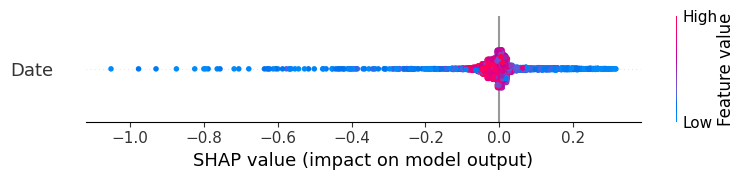

In [16]:
import shap

explainer = shap.Explainer(grid_search.best_estimator_)
shap_values = explainer(X)

# Plot SHAP values
shap.summary_plot(shap_values, X)


**Save Random Forest Model**

In [20]:
import joblib

# Save the trained Random Forest model
joblib.dump(grid_search.best_estimator_, 'sentiment_rf_model.pkl')


['sentiment_rf_model.pkl']

In [21]:
model = joblib.load('sentiment_rf_model.pkl')

# Save the processed DataFrame with sentiment scores
df.to_csv('processed_reviews.csv', index=False)


**Save the DataFrame**

In [22]:
import pandas as pd

# Load the saved processed DataFrame
df = pd.read_csv('processed_reviews.csv')


**Downlaod the Model**

In [23]:
from google.colab import files

# Download the Random Forest model
files.download('sentiment_rf_model.pkl')

# Download the processed CSV
files.download('processed_reviews.csv')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

**Get the model in drive**

In [24]:
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Save the model and DataFrame to Google Drive
df.to_csv('/content/drive/MyDrive/processed_reviews.csv', index=False)
joblib.dump(grid_search.best_estimator_, '/content/drive/MyDrive/sentiment_rf_model.pkl')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


['/content/drive/MyDrive/sentiment_rf_model.pkl']